In [1]:
%matplotlib notebook

nested: ParallelContextInterface: process id: 22113; global rank: 0 / 1; local rank: 0 / 1; worker id: 0 / 1
decode_simple_network_replay: processing run data for 5 trials took 0.2 s
process_replay_trial_data: pid: 22113 took 2.2 s to decode position for trial: 412
process_replay_trial_data: pid: 22113 took 2.2 s to decode position for trial: 241
process_replay_trial_data: pid: 22113 took 2.1 s to decode position for trial: 740
process_replay_trial_data: pid: 22113 took 2.1 s to decode position for trial: 69
process_replay_trial_data: pid: 22113 took 2.4 s to decode position for trial: 176
process_replay_trial_data: pid: 22113 took 2.2 s to decode position for trial: 726
process_replay_trial_data: pid: 22113 took 2.3 s to decode position for trial: 982
process_replay_trial_data: pid: 22113 took 2.3 s to decode position for trial: 884
process_replay_trial_data: pid: 22113 took 2.2 s to decode position for trial: 792
process_replay_trial_data: pid: 22113 took 2.2 s to decode position for

<IPython.core.display.Javascript object>


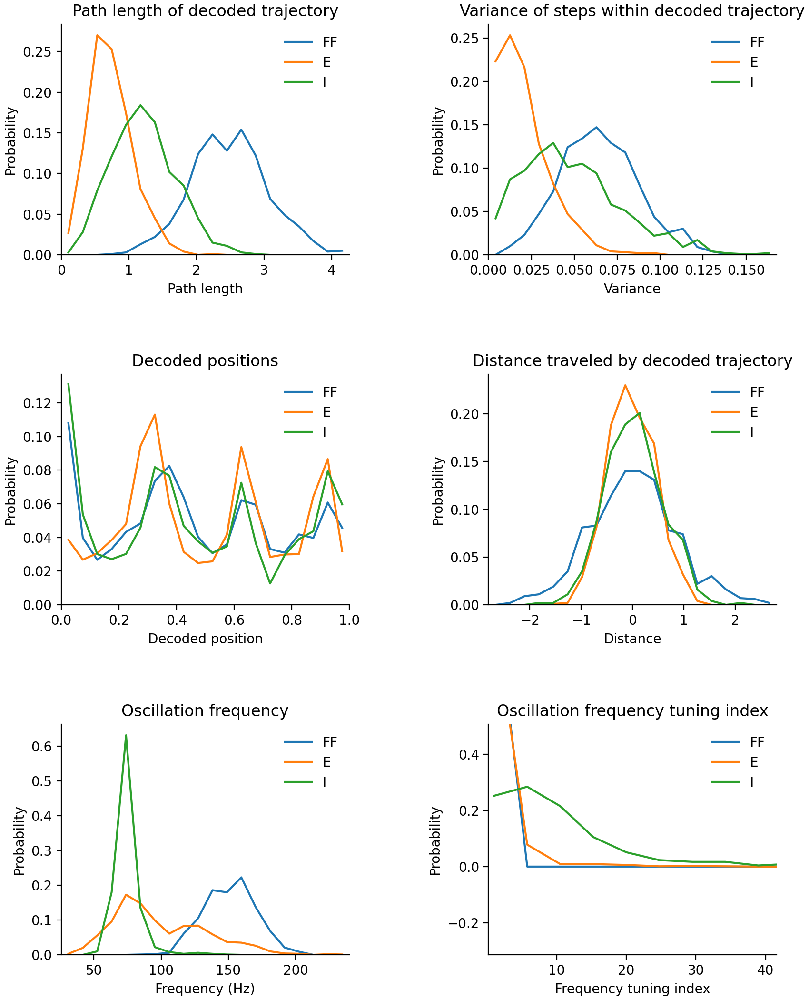

decode_simple_network_replay: processing replay data for 1000 trials took 26.1 s


<IPython.core.display.Javascript object>


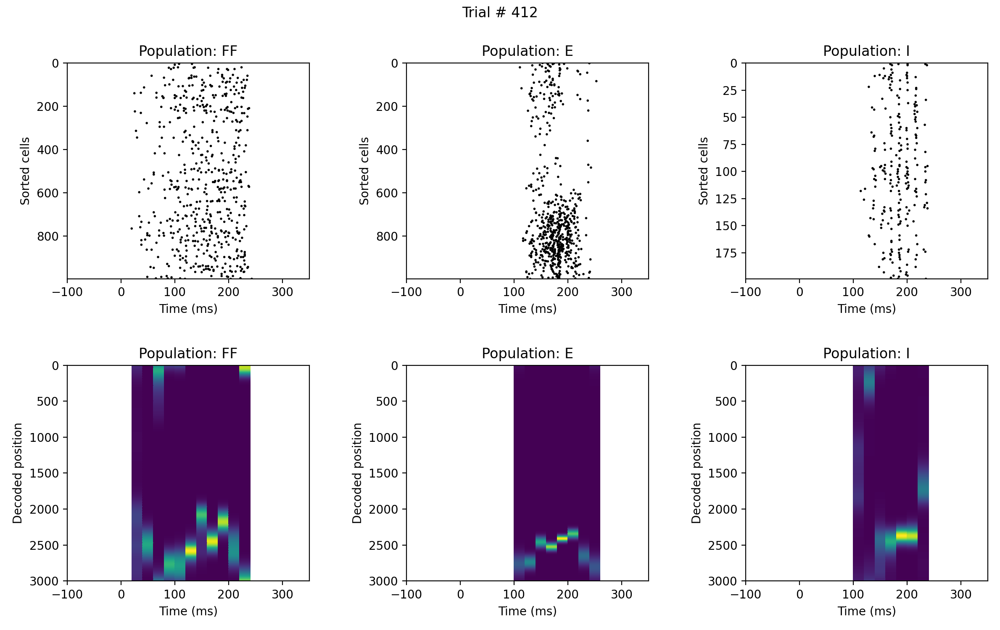

<IPython.core.display.Javascript object>


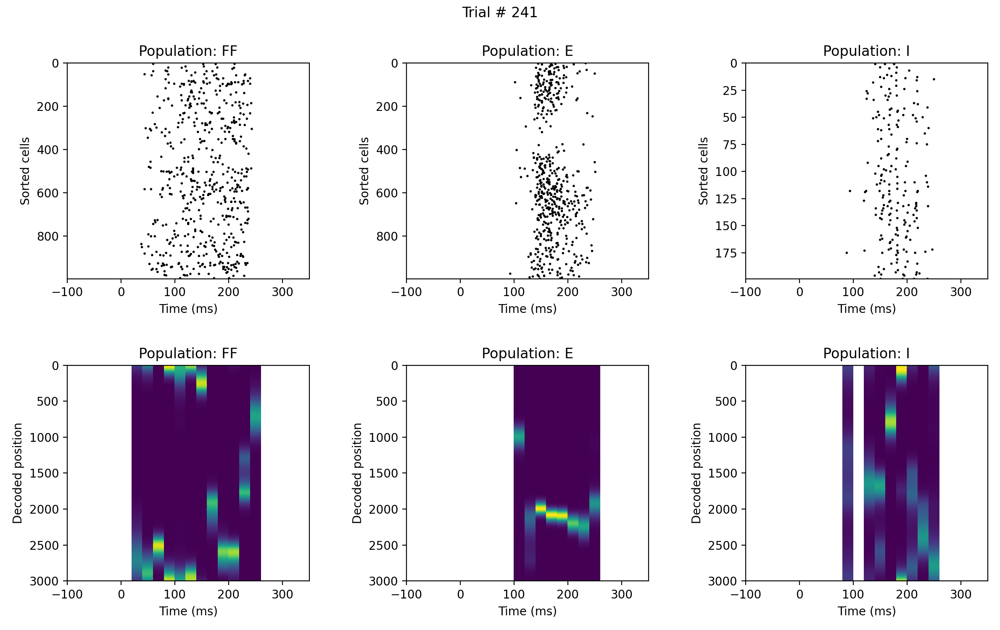

<IPython.core.display.Javascript object>


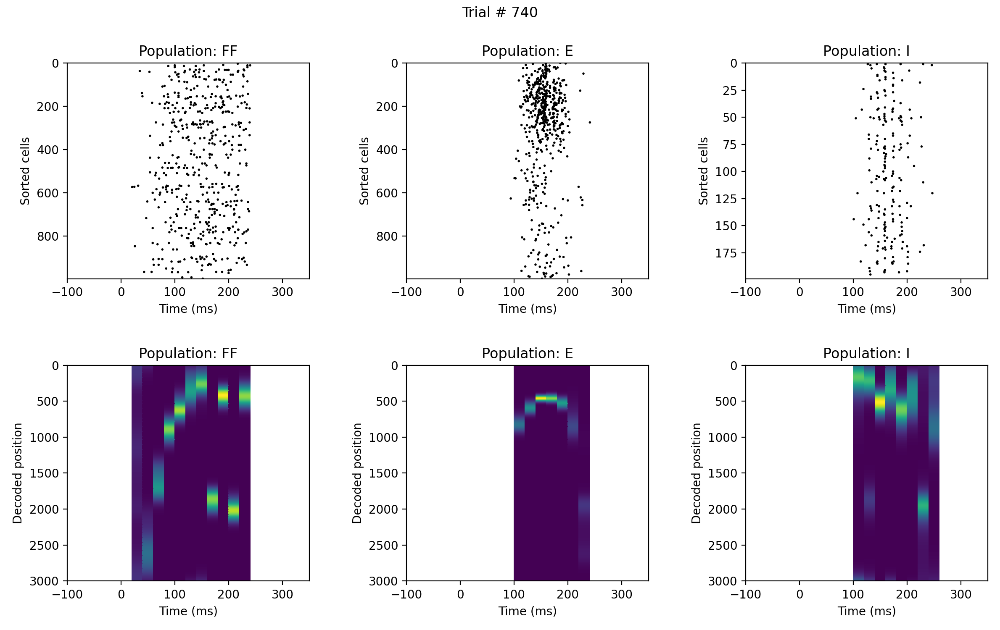

<IPython.core.display.Javascript object>


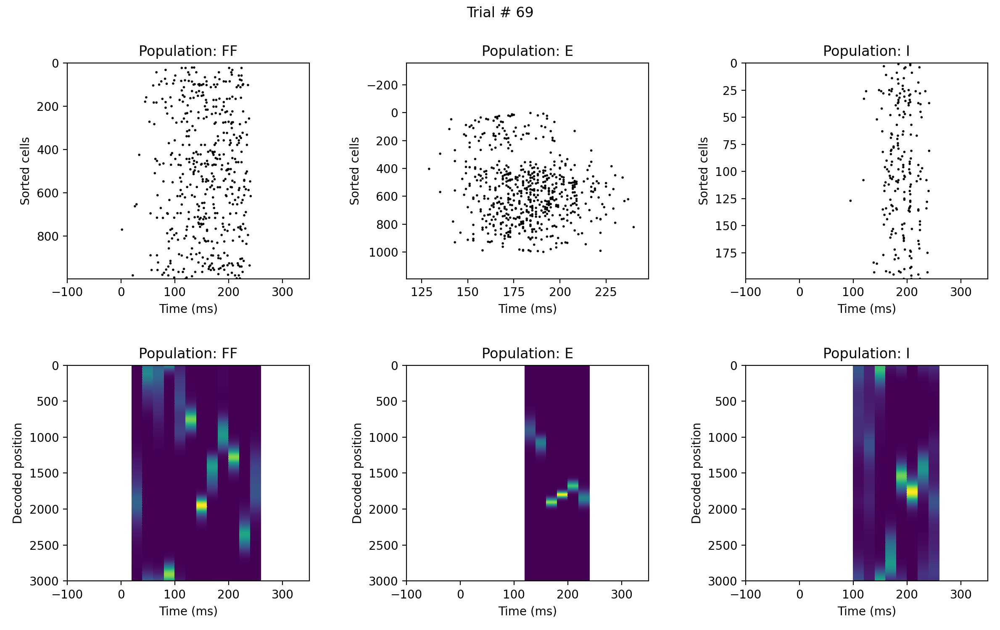

<IPython.core.display.Javascript object>


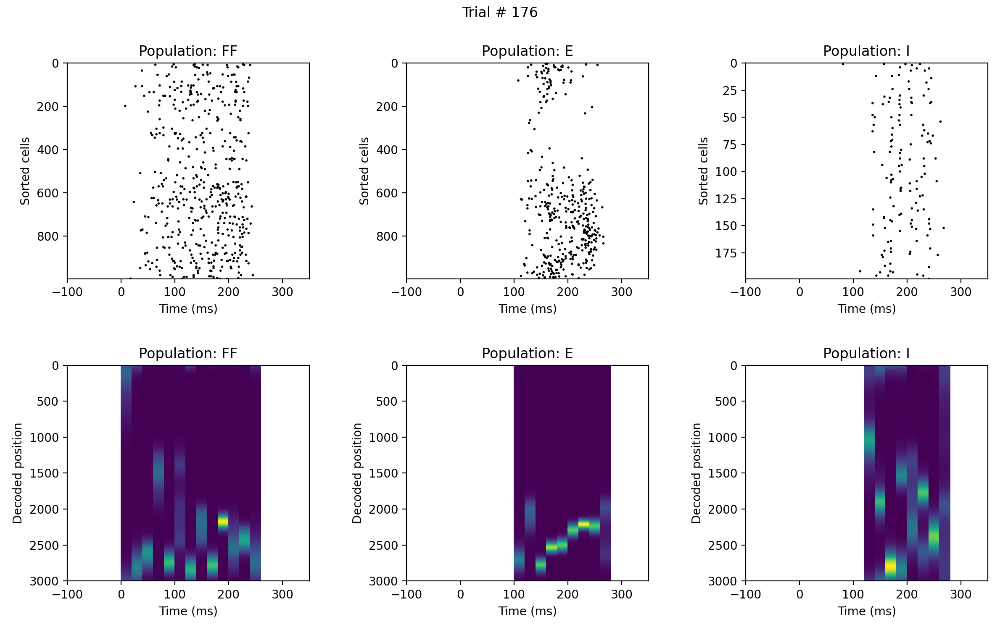

<IPython.core.display.Javascript object>


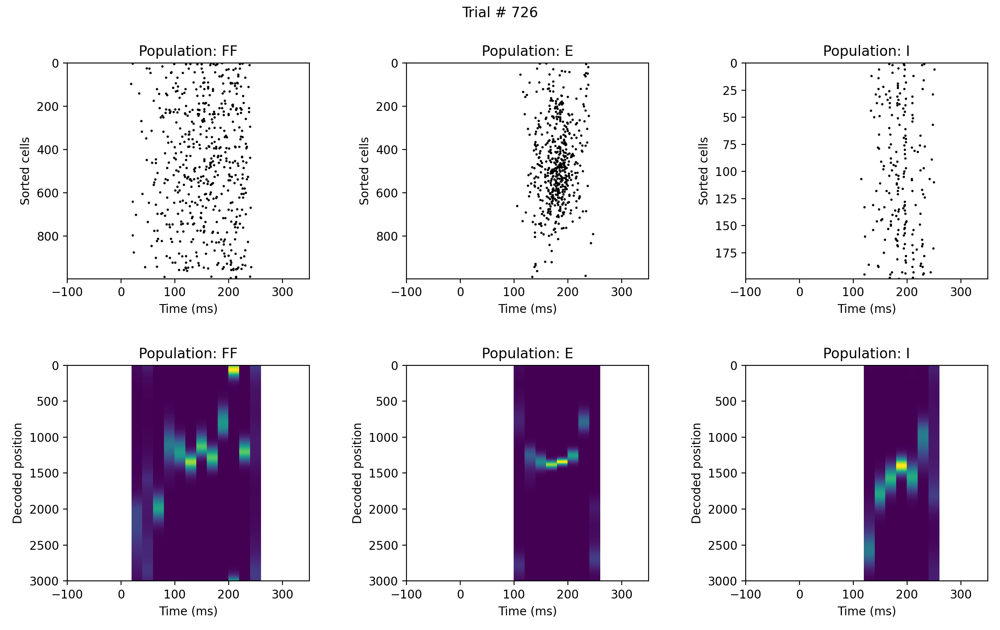

<IPython.core.display.Javascript object>


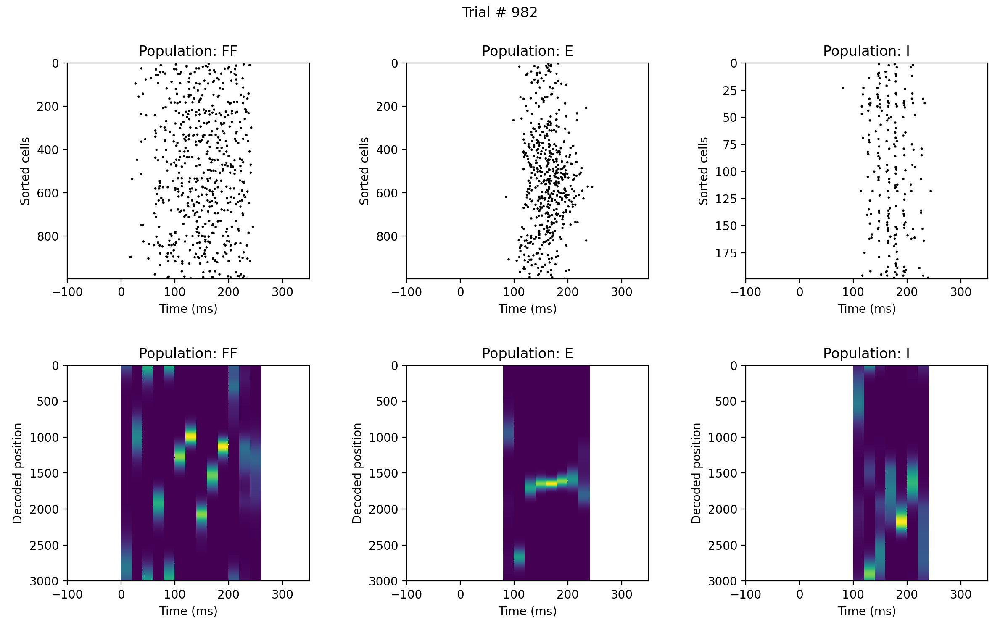

<IPython.core.display.Javascript object>


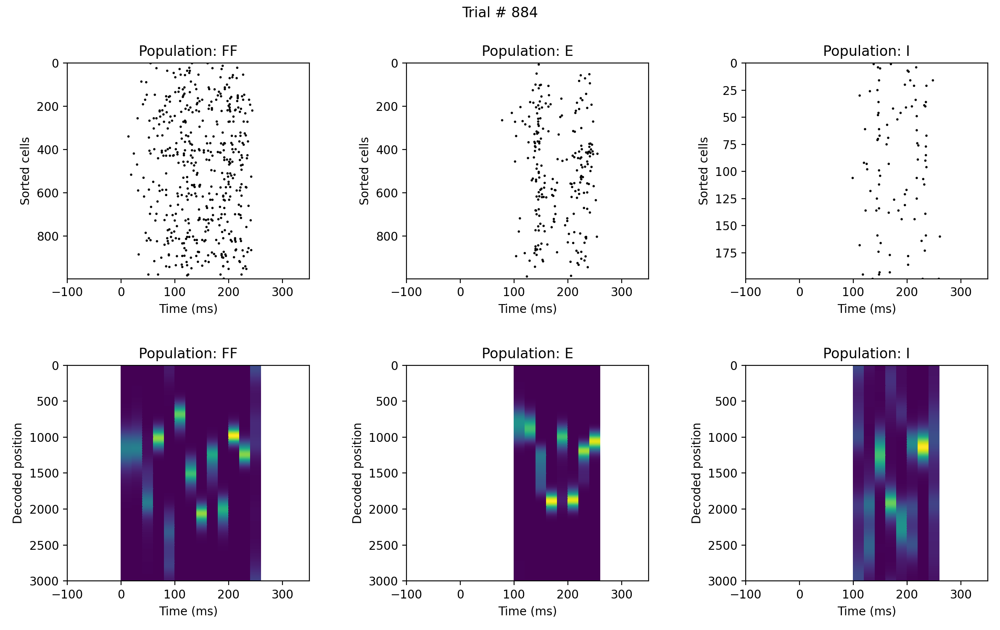

<IPython.core.display.Javascript object>


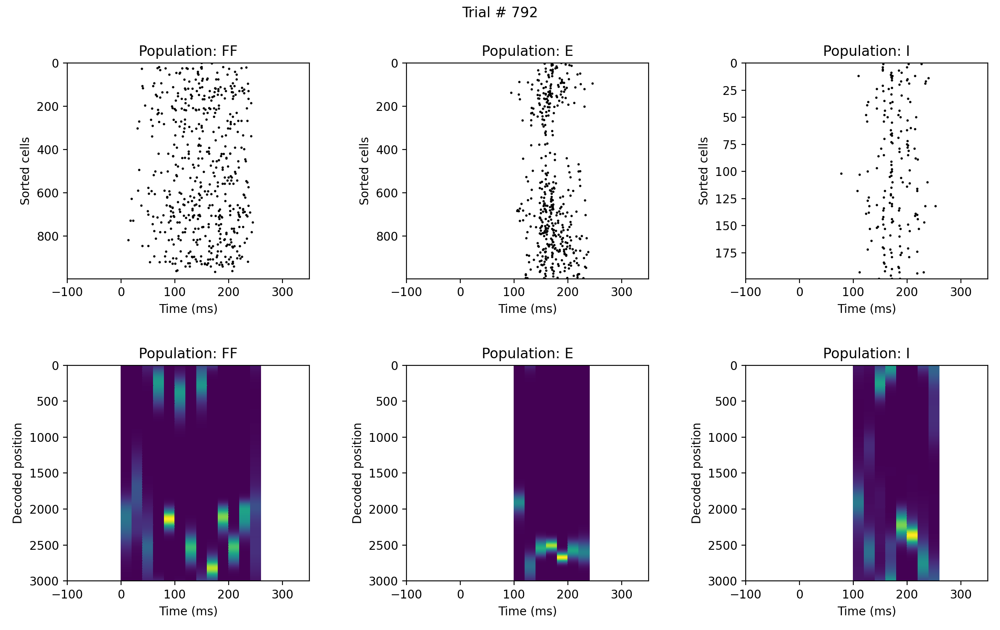

<IPython.core.display.Javascript object>


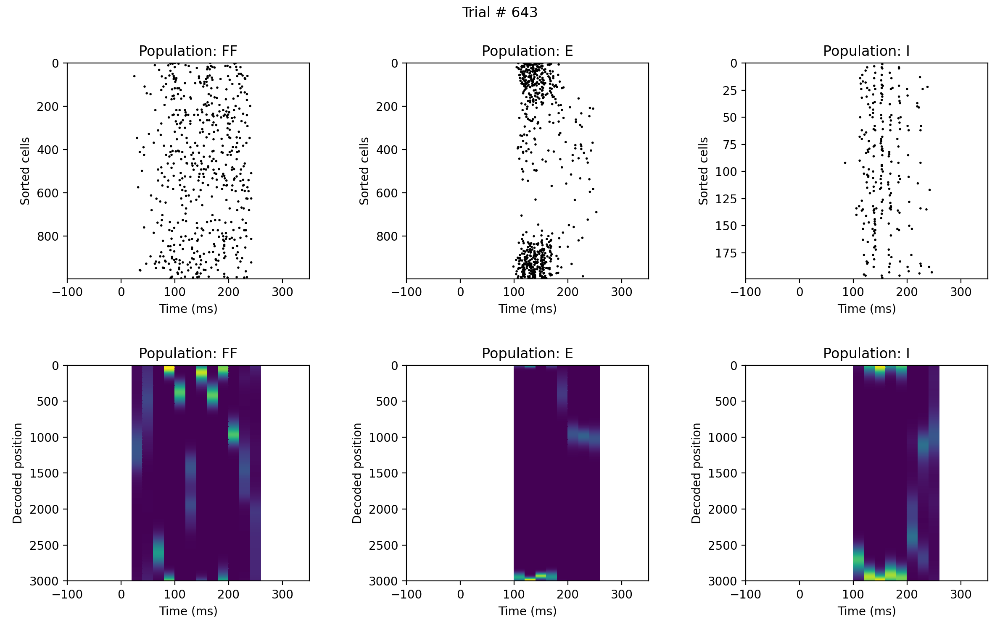

In [2]:
%run decode_simple_network_replay.py --run-data-file-path='data/20200623_144723_simple_network_J_0_exported_output.hdf5' \
    --replay-data-file-path='data/20200624_144135_simple_network_replay_J_0_exported_output.hdf5' \
    --plot --interactive --plot-n-trials=10

nested: ParallelContextInterface: process id: 22113; global rank: 0 / 1; local rank: 0 / 1; worker id: 0 / 1
decode_simple_network_replay: processing run data for 5 trials took 0.2 s
process_replay_trial_data: pid: 22113 took 2.4 s to decode position for trial: 817
process_replay_trial_data: pid: 22113 took 2.2 s to decode position for trial: 328
process_replay_trial_data: pid: 22113 took 2.3 s to decode position for trial: 553
process_replay_trial_data: pid: 22113 took 2.2 s to decode position for trial: 389
process_replay_trial_data: pid: 22113 took 2.2 s to decode position for trial: 796
process_replay_trial_data: pid: 22113 took 2.5 s to decode position for trial: 606
process_replay_trial_data: pid: 22113 took 2.3 s to decode position for trial: 17
process_replay_trial_data: pid: 22113 took 2.4 s to decode position for trial: 77
process_replay_trial_data: pid: 22113 took 2.3 s to decode position for trial: 720
process_replay_trial_data: pid: 22113 took 2.3 s to decode position for 

<IPython.core.display.Javascript object>


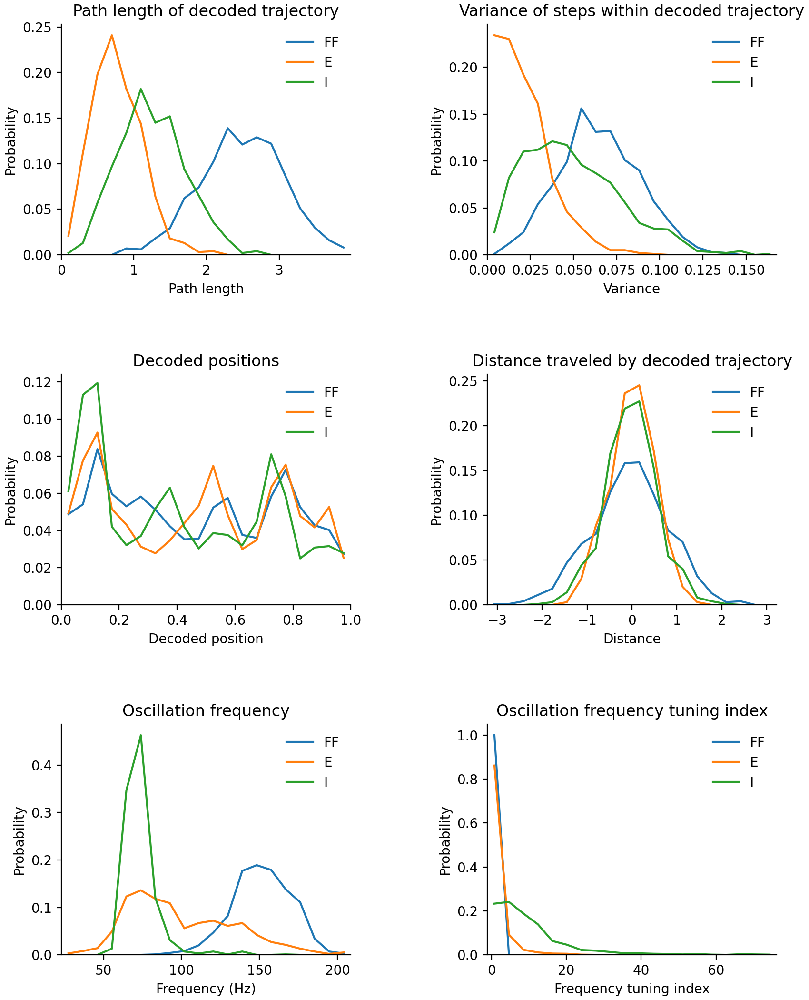

decode_simple_network_replay: processing replay data for 1000 trials took 27.0 s


<IPython.core.display.Javascript object>


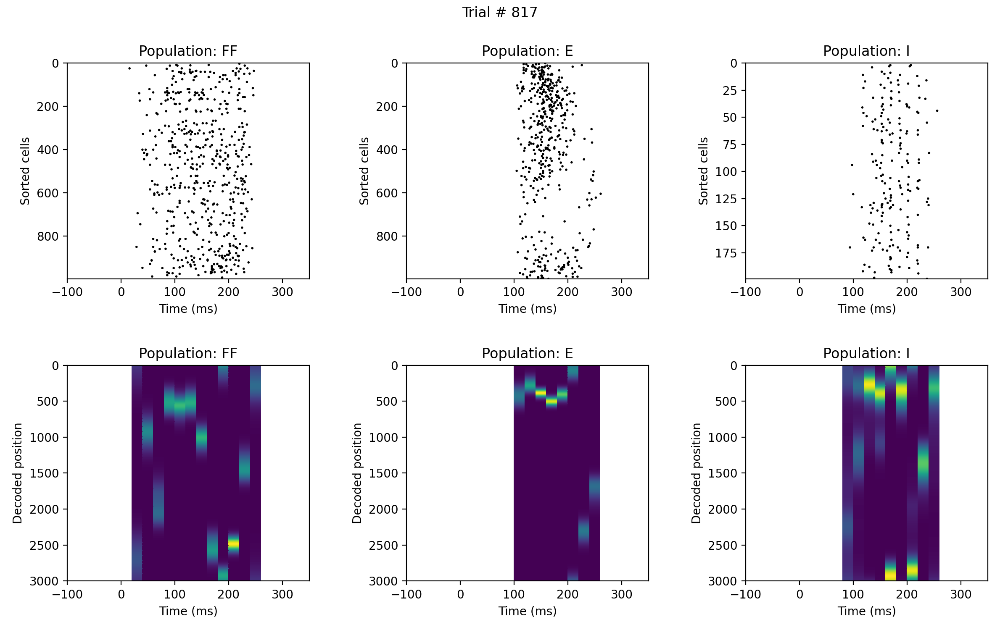

<IPython.core.display.Javascript object>


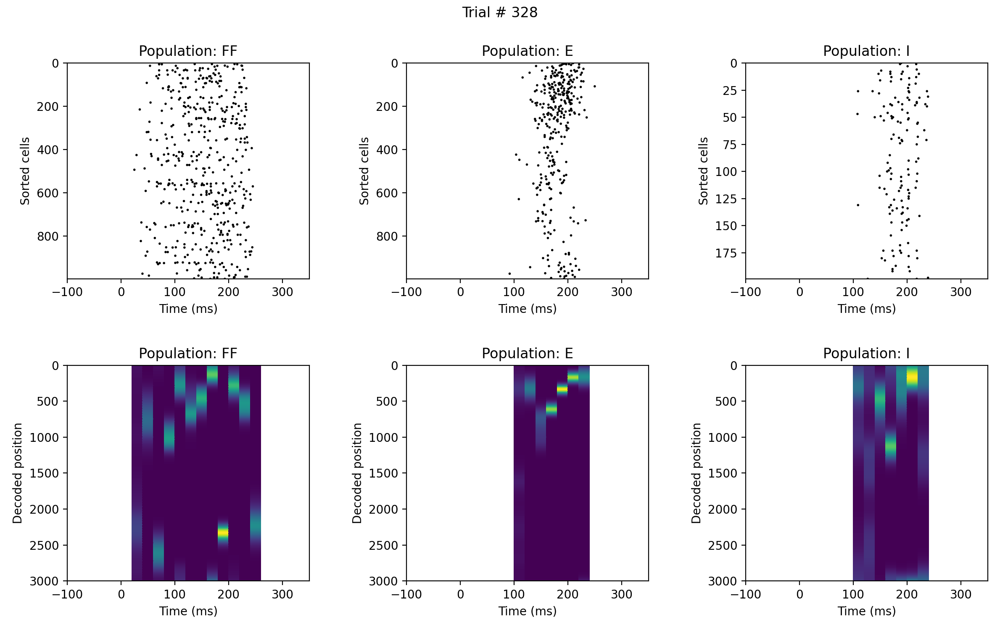

<IPython.core.display.Javascript object>


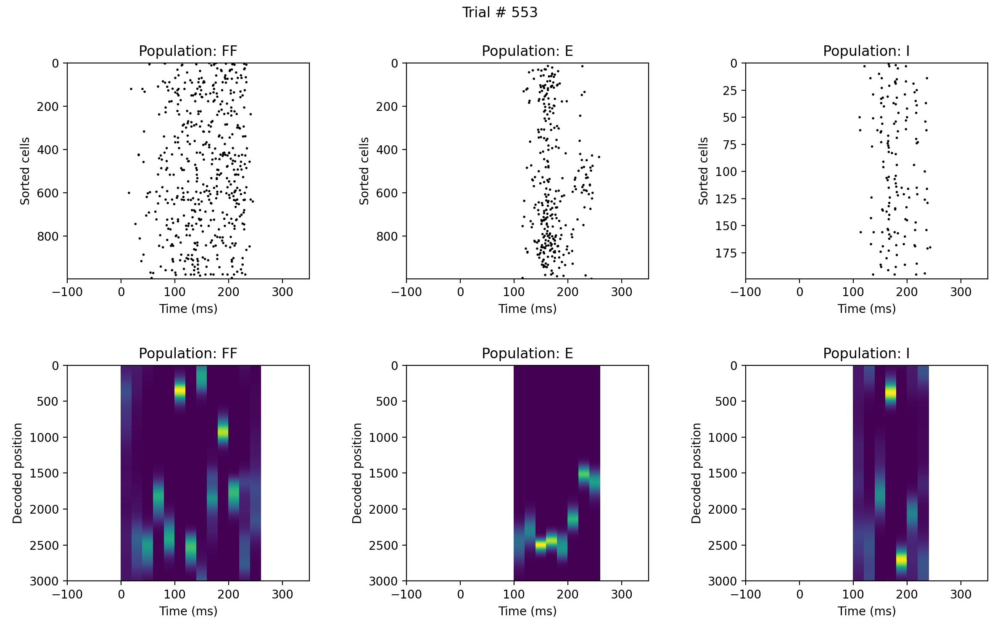

<IPython.core.display.Javascript object>


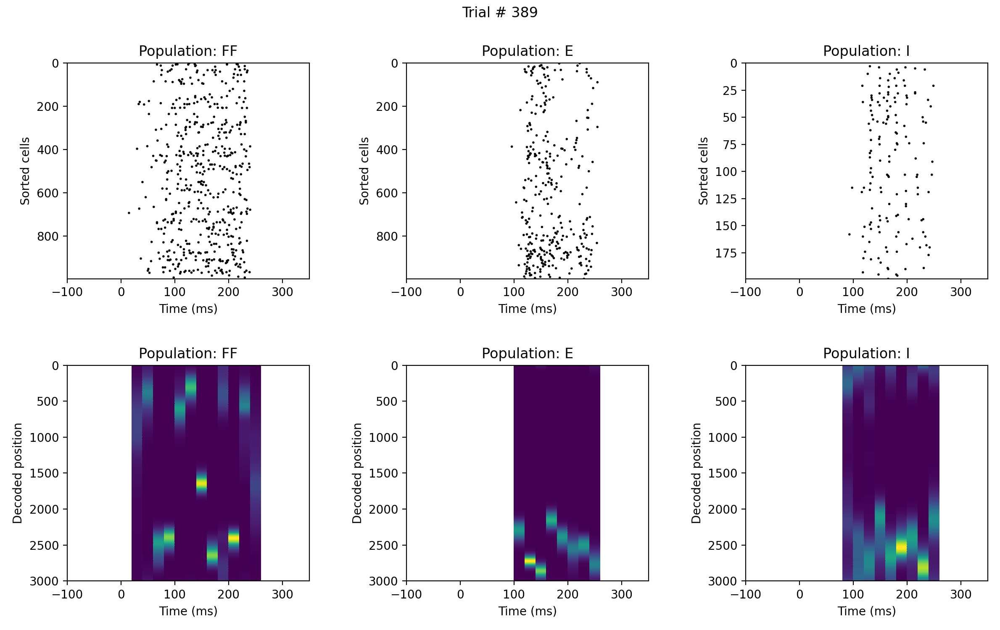

<IPython.core.display.Javascript object>


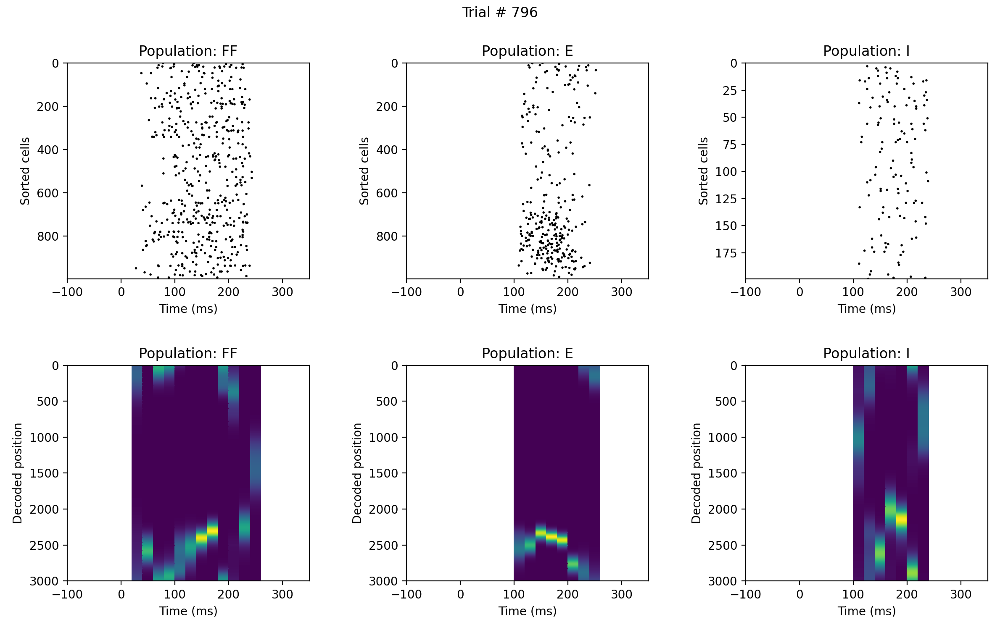

<IPython.core.display.Javascript object>


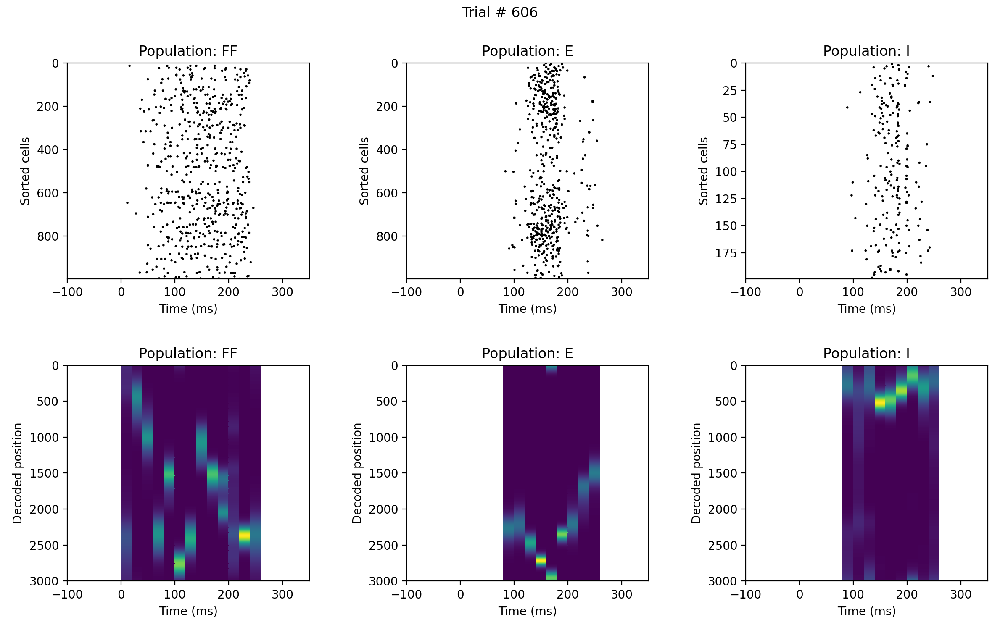

<IPython.core.display.Javascript object>


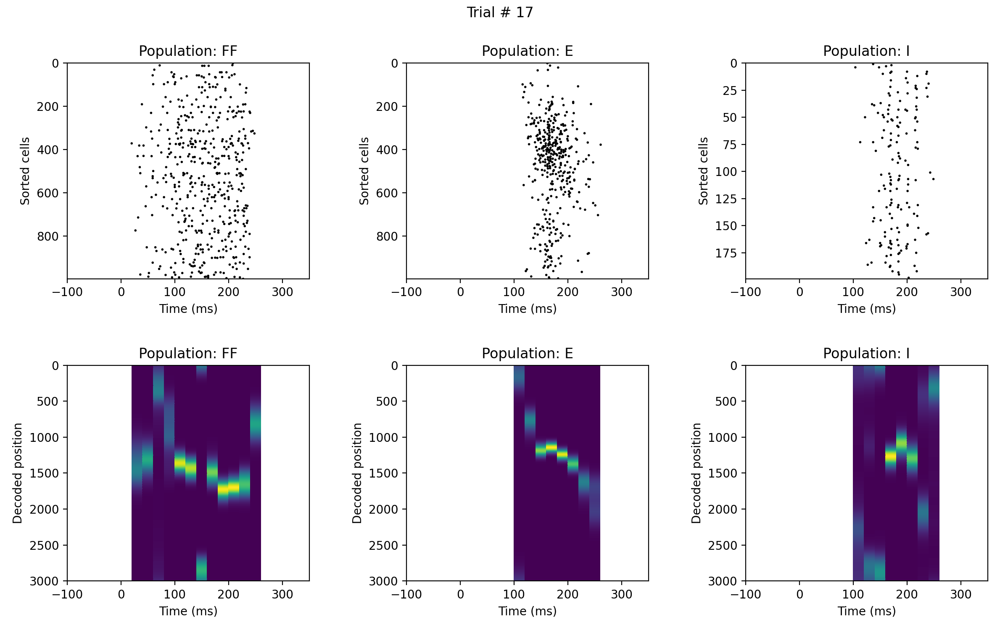

<IPython.core.display.Javascript object>


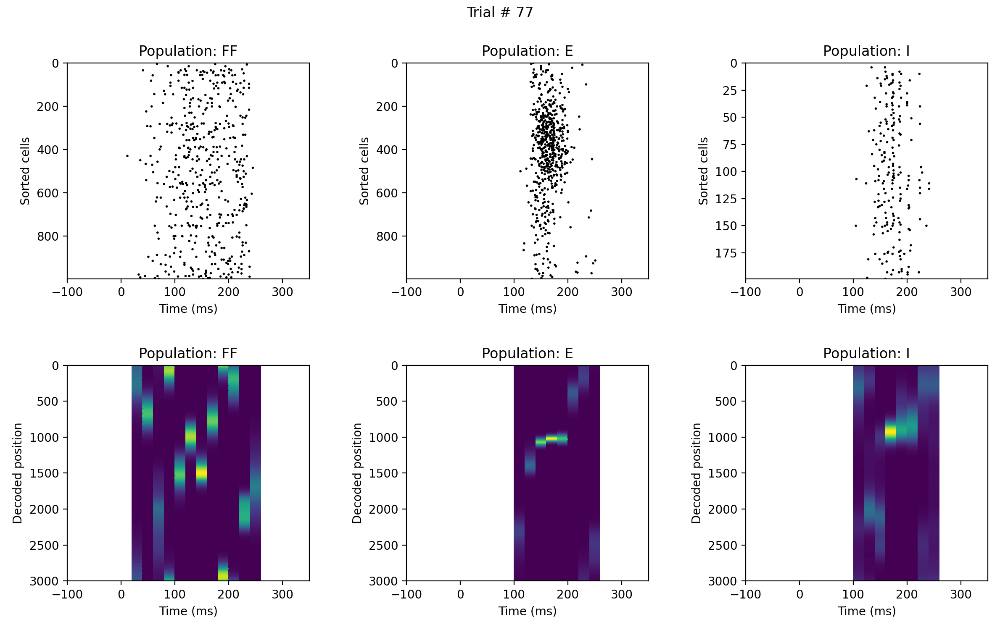

<IPython.core.display.Javascript object>


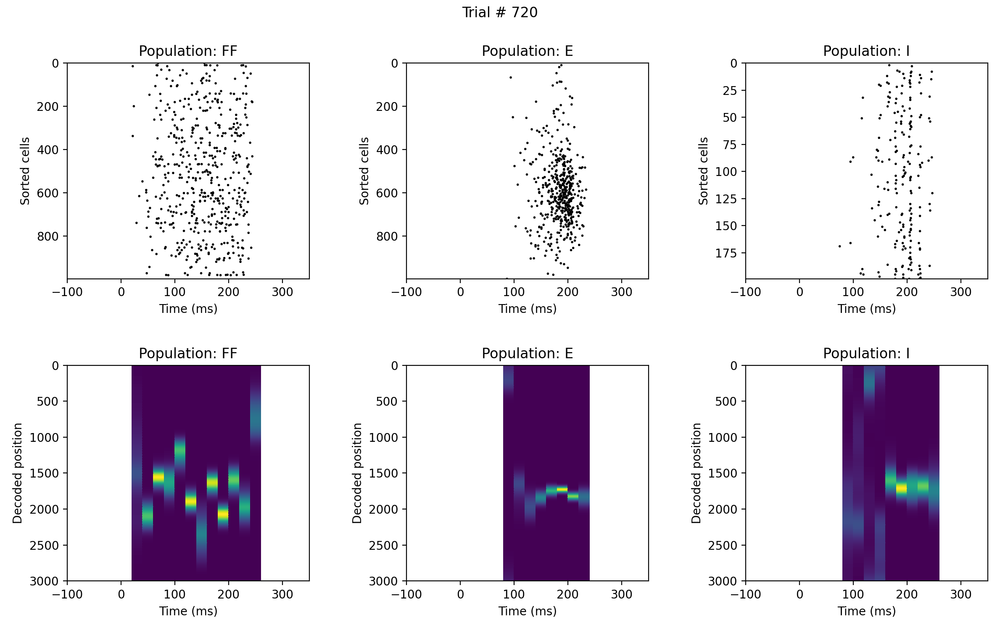

<IPython.core.display.Javascript object>


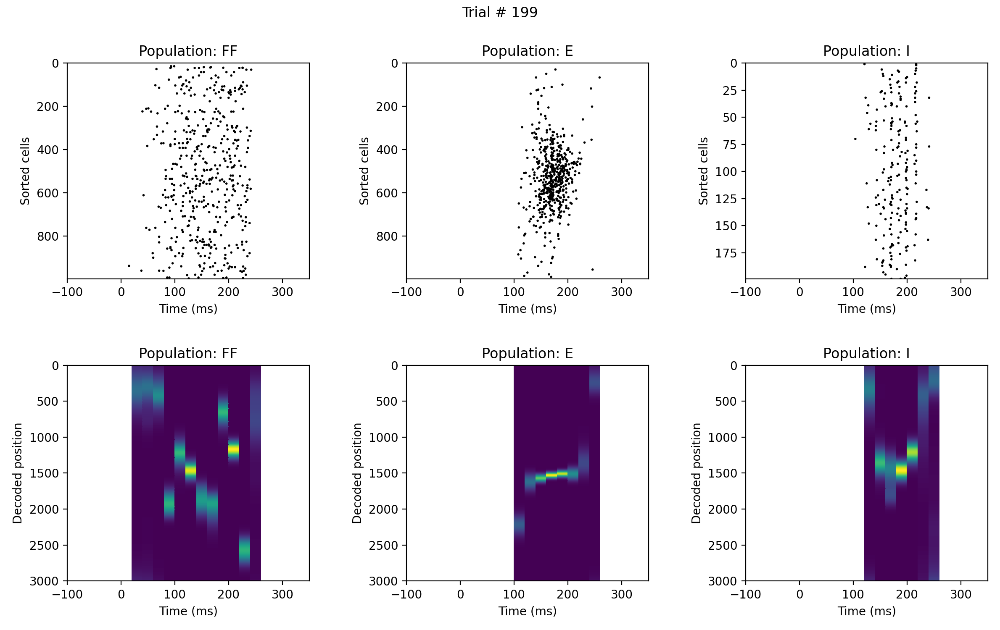

In [8]:
%run decode_simple_network_replay.py --run-data-file-path='data/20200623_163137_simple_network_J_1_exported_output.hdf5' \
    --replay-data-file-path='data/20200625_170444_simple_network_replay_J_1_exported_output.hdf5' \
    --plot --interactive --plot-n-trials=10

In [3]:
locals().update(context())

In [4]:
decoded_pos_matrix_dict = dict()
band_freq_dict = defaultdict(lambda: defaultdict(list))
band_tuning_index_dict = defaultdict(lambda: defaultdict(list))
with h5py.File(replay_data_file_path, 'r') as f:
    group = get_h5py_group(f, ['shared_context', 'decoded_pos_matrix'])
    for pop_name in group:
        decoded_pos_matrix_dict[pop_name] = group[pop_name][:]
    exported_data_group_key = 'simple_network_exported_data'
    for trial_key in (key for key in f if exported_data_group_key in f[key]):
        group = get_h5py_group(f, [trial_key, exported_data_group_key, 'filter_results'])
        subgroup = group['centroid_freq']
        for band in subgroup:
            for pop_name in subgroup[band].attrs:
                band_freq_dict[band][pop_name].append(subgroup[band].attrs[pop_name])
        subgroup = group['freq_tuning_index']
        for band in subgroup:
            for pop_name in subgroup[band].attrs:
                band_tuning_index_dict[band][pop_name].append(subgroup[band].attrs[pop_name])    

In [5]:
track_length = context.run_binned_t[-1] - context.run_binned_t[0]

In [6]:
all_decoded_pos_dict = dict()
decoded_pos_diff_var_dict = defaultdict(list)
decoded_path_len_dict = defaultdict(list)
decoded_distance_dict = defaultdict(list)

for pop_name in decoded_pos_matrix_dict:
    this_decoded_pos_matrix = decoded_pos_matrix_dict[pop_name] / track_length
    clean_indexes = ~np.isnan(this_decoded_pos_matrix)
    all_decoded_pos_dict[pop_name] = this_decoded_pos_matrix[clean_indexes]
    this_decoded_pos_diff = np.diff(this_decoded_pos_matrix, axis=1)
    for trial in range(this_decoded_pos_diff.shape[0]):
        this_trial_diff = this_decoded_pos_diff[trial,:]
        clean_indexes = ~np.isnan(this_trial_diff)
        if len(clean_indexes) > 0:
            this_trial_diff = this_trial_diff[clean_indexes]
            this_trial_diff[np.where(this_trial_diff < -0.5)] += 1.
            this_trial_diff[np.where(this_trial_diff > 0.5)] -= 1.
            this_path_len = np.sum(np.abs(this_trial_diff))
            decoded_path_len_dict[pop_name].append(this_path_len)
            this_distance = np.sum(this_trial_diff)
            decoded_distance_dict[pop_name].append(this_distance)
            if len(clean_indexes) > 1:
                this_trial_diff_var = np.var(this_trial_diff)
                decoded_pos_diff_var_dict[pop_name].append(this_trial_diff_var)

<IPython.core.display.Javascript object>


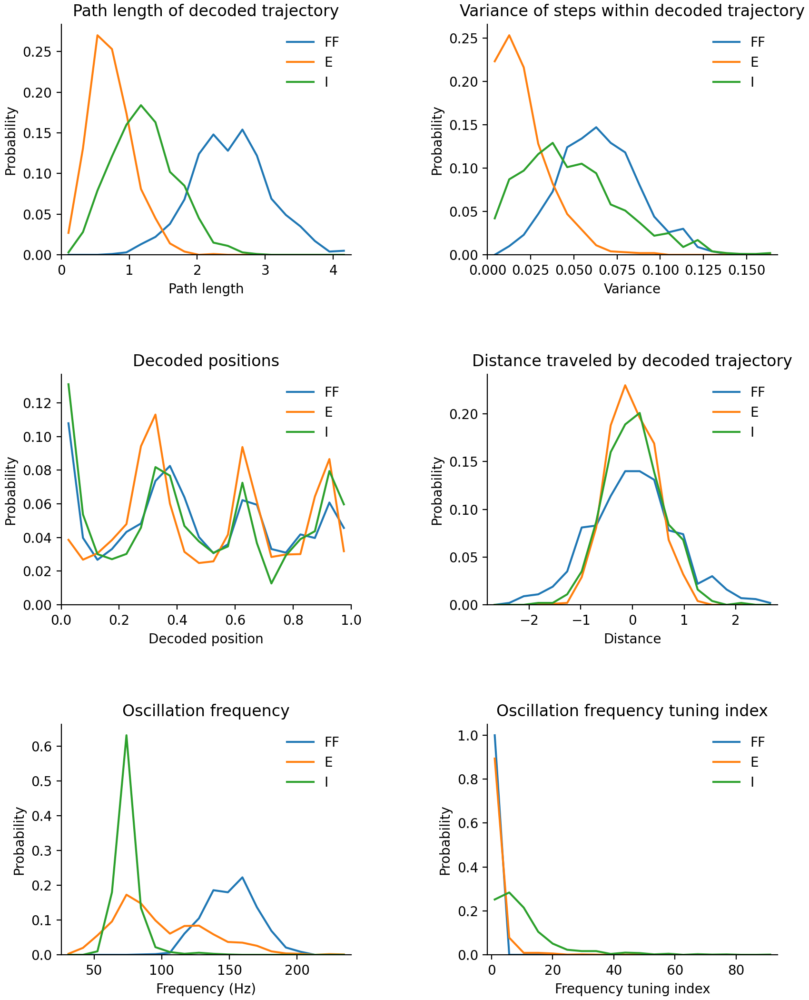

FF [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
E [0.894 0.078 0.009 0.009 0.006 0.001 0.002 0.001 0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.   ]
I [0.252 0.284 0.215 0.105 0.051 0.023 0.017 0.017 0.004 0.01  0.008 0.002
 0.005 0.    0.003 0.001 0.002 0.    0.    0.001]


In [7]:
if plot:
    ordered_pop_names = ['FF', 'E', 'I']
    for pop_name in ordered_pop_names:
        if pop_name not in decoded_pos_matrix_dict:
            ordered_pop_names.remove(pop_name)
    for pop_name in decoded_pos_matrix_dict:
        if pop_name not in ordered_pop_names:
            ordered_pop_names.append(pop_name)
    fig, axes = plt.subplots(3, 2, figsize=(8.5, 10.5), constrained_layout=True)
    
    for pop_name in ordered_pop_names:
        hist, edges = np.histogram(all_decoded_pos_dict[pop_name], bins=np.linspace(0., 1., 21), density=True)
        bin_width = (edges[1] - edges[0])
        axes[1][0].plot(edges[1:] - bin_width / 2., hist * bin_width, label=pop_name)
    axes[1][0].set_xlim((0., 1.))
    axes[1][0].set_ylim((0., axes[1][0].get_ylim()[1]))
    axes[1][0].set_xlabel('Decoded position')
    axes[1][0].set_ylabel('Probability')
    axes[1][0].legend(loc='best', frameon=False, framealpha=0.5)
    axes[1][0].set_title('Decoded positions')

    max_variance = np.max(list(decoded_pos_diff_var_dict.values()))
    for pop_name in ordered_pop_names:
        hist, edges = np.histogram(decoded_pos_diff_var_dict[pop_name], bins=np.linspace(0., max_variance, 21),
                                   density=True)
        bin_width = (edges[1] - edges[0])
        axes[0][1].plot(edges[1:] - bin_width / 2., hist * bin_width, label=pop_name)
    axes[0][1].set_xlim((0., max_variance))
    axes[0][1].set_ylim((0., axes[0][1].get_ylim()[1]))
    axes[0][1].set_xlabel('Variance')
    axes[0][1].set_ylabel('Probability')
    axes[0][1].legend(loc='best', frameon=False, framealpha=0.5)
    axes[0][1].set_title('Variance of steps within decoded trajectory')

    max_path_len = np.max(list(decoded_path_len_dict.values()))
    for pop_name in ordered_pop_names:
        hist, edges = np.histogram(decoded_path_len_dict[pop_name], bins=np.linspace(0., max_path_len, 21),
                                   density=True)
        bin_width = (edges[1] - edges[0])
        axes[0][0].plot(edges[1:] - bin_width / 2., hist * bin_width, label=pop_name)
    axes[0][0].set_xlim((0., max_path_len))
    axes[0][0].set_ylim((0., axes[0][0].get_ylim()[1]))
    axes[0][0].set_xlabel('Path length')
    axes[0][0].set_ylabel('Probability')
    axes[0][0].legend(loc='best', frameon=False, framealpha=0.5)
    axes[0][0].set_title('Path length of decoded trajectory')
    
    max_distance = np.max(np.abs(list(decoded_distance_dict.values())))
    for pop_name in ordered_pop_names:
        hist, edges = np.histogram(decoded_distance_dict[pop_name], bins=np.linspace(-max_distance, max_distance, 21),
                                   density=True)
        bin_width = (edges[1] - edges[0])
        axes[1][1].plot(edges[1:] - bin_width / 2., hist * bin_width, label=pop_name)
    axes[1][1].set_xlim((-max_distance, max_distance))
    axes[1][1].set_ylim((0., axes[1][1].get_ylim()[1]))
    axes[1][1].set_xlabel('Distance')
    axes[1][1].set_ylabel('Probability')
    axes[1][1].legend(loc='best', frameon=False, framealpha=0.5)
    axes[1][1].set_title('Distance traveled by decoded trajectory')
    
    min_freq = np.min(list(band_freq_dict['Ripple'].values()))
    max_freq = np.max(list(band_freq_dict['Ripple'].values()))
    for pop_name in ordered_pop_names:
        hist, edges = np.histogram(band_freq_dict['Ripple'][pop_name], bins=np.linspace(min_freq, max_freq, 21),
                                   density=True)
        bin_width = (edges[1] - edges[0])
        axes[2][0].plot(edges[1:] - bin_width / 2., hist * bin_width, label=pop_name)
    axes[2][0].set_xlim((min_freq, max_freq))
    axes[2][0].set_ylim((0., axes[2][0].get_ylim()[1]))
    axes[2][0].set_xlabel('Frequency (Hz)')
    axes[2][0].set_ylabel('Probability')
    axes[2][0].legend(loc='best', frameon=False, framealpha=0.5)
    axes[2][0].set_title('Oscillation frequency')
    
    min_tuning_index = np.min(list(band_tuning_index_dict['Ripple'].values()))
    max_tuning_index = np.max(list(band_tuning_index_dict['Ripple'].values()))
    for pop_name in ordered_pop_names:
        hist, edges = np.histogram(band_tuning_index_dict['Ripple'][pop_name], 
                                   bins=np.linspace(min_tuning_index, max_tuning_index, 21),
                                   density=True)
        bin_width = (edges[1] - edges[0])
        print(pop_name, hist * bin_width)
        axes[2][1].plot(edges[1:] - bin_width / 2., hist * bin_width, label=pop_name)
    axes[2][1].set_xlim((min_tuning_index, max_tuning_index))
    axes[2][1].set_ylim((0., axes[2][1].get_ylim()[1]))
    axes[2][1].set_xlabel('Frequency tuning index')
    axes[2][1].set_ylabel('Probability')
    axes[2][1].legend(loc='best', frameon=False, framealpha=0.5)
    axes[2][1].set_title('Oscillation frequency tuning index')
    
    clean_axes(axes)
    fig.set_constrained_layout_pads(hspace=0.15, wspace=0.15)
    fig.show()

In [ ]:
band_tuning_index_dict['Ripple']['FF']

In [ ]:
min_tuning_index

In [ ]:
max_tuning_index

In [ ]:
edges